Copied from Scott's script and adjusted

In [3]:
import glob
import os
from os.path import join as opj
import re
import shutil
import random
import string
import multiprocessing as mp
from functools import partial
#from plotting_utils import *

import numpy as np
import pandas as pd
import sys
np.set_printoptions(threshold=sys.maxsize)

import nilearn
from nilearn import regions
from nilearn import plotting, image
from nilearn.input_data import NiftiMasker
import nibabel as nib
from nipype.interfaces import ants
import nighres
import subprocess
from utils import apply_warp

import json
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

ModuleNotFoundError: No module named 'utils'

Use freesurfers thalamic segemtation protocol to get subnuclei

for now only using T1w image but can add another structural contrast to aid segmentation later

Iglesias, J. E., Insausti, R., Lerma-Usabiaga, G., Bocchetta, M., Van Leemput, K., Greve, D. N., van der Kouwe, A., Alzheimer's Disease Neuroimaging Initiative, Fischl, B., Caballero-Gaudes, C., & Paz-Alonso, P. M. (2018). A probabilistic atlas of the human thalamic nuclei combining ex vivo MRI and histology. NeuroImage, 183, 314–326. https://doi.org/10.1016/j.neuroimage.2018.08.012

### Run thalamic segmentation on pre. processed subs
must have newest version of freesurfer installed
output files: 

ThalamicNuclei.v12.<analysisID>.volumes.txt: text file with estimated volumes.

ThalamicNuclei.v12.<analysisID>.mgz: discrete segmentation at 0.5 mm.

ThalamicNuclei.v12.<analysisID>.FSvoxelSpace.mgz: discrete segmentation volume in FreeSurfer voxel space.
    
annoyingly this tool has to use the freesurfer T1 data, which is automatically resampled to 0.5mm instead of the .75mm it was acquired in. Not a big deal, just annoying.

#### write shell script to run freesurfer

In [1]:
subs = [(x.split('/')[-2]) for x in sorted(glob.glob('../derivatives/fmriprep/fmriprep/sub*/ses-rlsat'))]
subs

NameError: name 'glob' is not defined

In [5]:
# where is freesurfer data?
freesurfer_dir = '/home/Public/trondheim/derivatives/fmriprep/freesurfer/'
# where to move the fiels to?
new_dir = '/home/stevenm/test_freesurfer/freesurfer/'
# which subs to copy over from trondheim/derivatives/fmrirep/freesurfer?
# subs = ['sub-' + x for x in ['002','003','004','005','006','007','008','009','010','011']]
# subs = ['sub-' + x for x in ['012','013','014','015','016','017','018','019','020','021','022','023','024','025','026']]
# subs = ['sub-' + x for x in ['043', '044']]
subs = ['sub-' + x for x in ['024','026', '033', '035', '039', '041', '042', '043', '044']]

# which folders?
all_folds = [freesurfer_dir + x for x in subs]
# subs for shell script
sh_subs = ' '.join(subs)

In [6]:
# !mkdir test_freesurfer

In [7]:
for i in all_folds:
    new = i.replace(freesurfer_dir, new_dir)
    print(new)
    shutil.copytree(i,new,dirs_exist_ok=True)

/home/stevenm/test_freesurfer/freesurfer/sub-024
/home/stevenm/test_freesurfer/freesurfer/sub-026
/home/stevenm/test_freesurfer/freesurfer/sub-033
/home/stevenm/test_freesurfer/freesurfer/sub-035
/home/stevenm/test_freesurfer/freesurfer/sub-039
/home/stevenm/test_freesurfer/freesurfer/sub-041
/home/stevenm/test_freesurfer/freesurfer/sub-042
/home/stevenm/test_freesurfer/freesurfer/sub-043
/home/stevenm/test_freesurfer/freesurfer/sub-044


In [8]:
# write shell sscipts to call freesurfer command
sh_script = f'''
#!/bin/bash

for i in {sh_subs}
    do 
        segmentThalamicNuclei.sh $i /home/stevenm/test_freesurfer/freesurfer
done
'''

sh_file = open('/home/stevenm/test_freesurfer/run_thalamic_segmentation.sh', 'w')
n = sh_file.write(sh_script)
sh_file.close()

In [9]:
# mmust now make sh script executable
subprocess.run(['chmod','+x','/home/stevenm/test_freesurfer/run_thalamic_segmentation.sh'])

CompletedProcess(args=['chmod', '+x', '/home/stevenm/test_freesurfer/run_thalamic_segmentation.sh'], returncode=0)

In [10]:
!/home/stevenm/test_freesurfer/run_thalamic_segmentation.sh

Setting ITK threads to 1
#--------------------------------------------
#@# Thalamic Nuclei processing Tue 09 Aug 2022 11:39:31 AM CEST
------------------------------------------
Setting up environment variables
---
LD_LIBRARY_PATH is .:/usr/local/freesurfer/7.2.0/MCRv84//runtime/glnxa64:/usr/local/freesurfer/7.2.0/MCRv84//bin/glnxa64:/usr/local/freesurfer/7.2.0/MCRv84//sys/os/glnxa64:/usr/local/freesurfer/7.2.0/MCRv84//sys/java/jre/glnxa64/jre/lib/amd64/native_threads:/usr/local/freesurfer/7.2.0/MCRv84//sys/java/jre/glnxa64/jre/lib/amd64/server:/usr/local/freesurfer/7.2.0/MCRv84//sys/java/jre/glnxa64/jre/lib/amd64/client:/usr/local/freesurfer/7.2.0/MCRv84//sys/java/jre/glnxa64/jre/lib/amd64:/usr/local/MATLAB/R2019b/bin/glnxa64:/usr/local/MATLAB/R2019b/sys/os/glnxa64:/usr/local/MATLAB/R2019b/bin/glnxa64:/usr/local/MATLAB/R2019b/sys/os/glnxa64:
Registering imageDump.mgz to mask from ASEG
Reading contexts of file /usr/local/freesurfer/7.2.0/average/ThalamicNuclei/atlas/compressionLookupTa

In [13]:
# points to shell script that loops through subjects and runs freesurfers segmentThalamicNuclei.sh
# subprocess.run(['/home/stevenm/test_freesurfer/run_thalamic_segmentation.sh'])

# ^^^^ find a way for this to work, otherwise have to run from command line manually

OSError: [Errno 8] Exec format error: '/home/stevenm/test_freesurfer/run_thalamic_segmentation.sh'

### Convert mgz freesurfer output to niftis

In [11]:
# ALREADY RUN
mgzs = glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/ThalamicNuclei*.mgz')
mgzs = mgzs + glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/T1.mgz')
# mgzs = glob.glob('/home/scotti/test_freesurfer/freesurfer/mni1/mri/ThalamicNuclei*.mgz')
# mgzs
for i in mgzs:
    subprocess.run(["mri_convert",f"{i}",f"{i.replace('mgz','nii.gz')}"])

mri_convert /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.mgz /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.nii.gz 
reading from /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.mgz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 7.54653e-10, 3.23117e-27)
j_ras = (0, 2.91038e-11, -1)
k_ras = (-2.6173e-09, 1, -2.91038e-11)
writing to /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.nii.gz...
mri_convert /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.FSvoxelSpace.mgz /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.FSvoxelSpace.nii.gz 
reading from /home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.FSvoxelSpace.mgz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 7.54653e-10, 1.92593e-34)
j_ras = (0, 2.91038e-11, -1)
k_ras = (-2.6173e-09, 1, -2.91038e-11)
writing to /home/stevenm/te

### Take a look at the segmentations

In [5]:
import glob
import nibabel as nib
# awesome, looks good...

# bgs = sorted(glob.glob('../derivatives/fmriprep/fmriprep/sub-004/anat/sub-*_desc-preproc_T1w.nii.gz'))
bgs = sorted(glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/T1.mgz'))
thals = sorted(glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/ThalamicNuclei.v12*.nii.gz'))
thals = [x for x in thals if not 'FS' in x]

#nib.load(thals[0]).affine

array([[-5.00000000e-01,  0.00000000e+00, -2.15550258e-10,
         4.13620911e+01],
       [ 2.07819539e-09,  0.00000000e+00,  5.00000000e-01,
        -2.42158508e+01],
       [ 0.00000000e+00, -5.00000000e-01,  5.82076679e-11,
         3.26704178e+01],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]])

/home/stevenm/test_freesurfer/freesurfer/sub-024/mri/T1.mgz
/home/stevenm/test_freesurfer/freesurfer/sub-026/mri/T1.mgz
/home/stevenm/test_freesurfer/freesurfer/sub-033/mri/T1.mgz
/home/stevenm/test_freesurfer/freesurfer/sub-035/mri/T1.mgz
/home/stevenm/test_freesurfer/freesurfer/sub-039/mri/T1.mgz


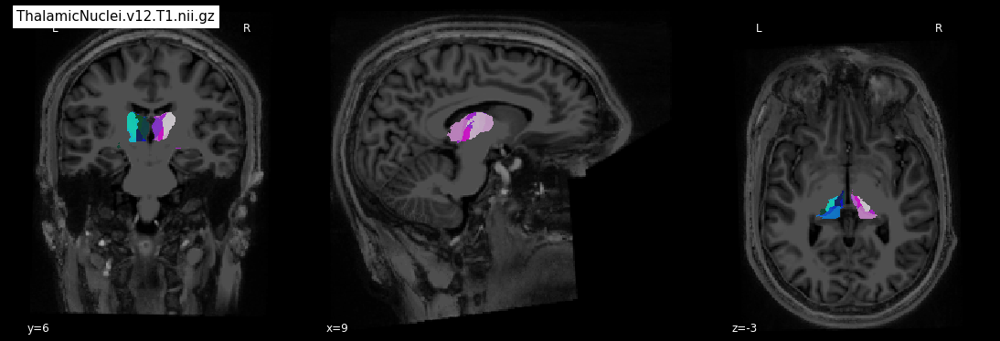

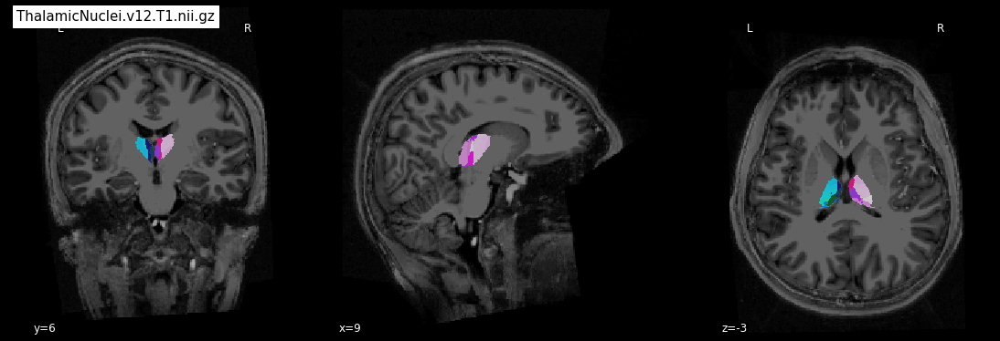

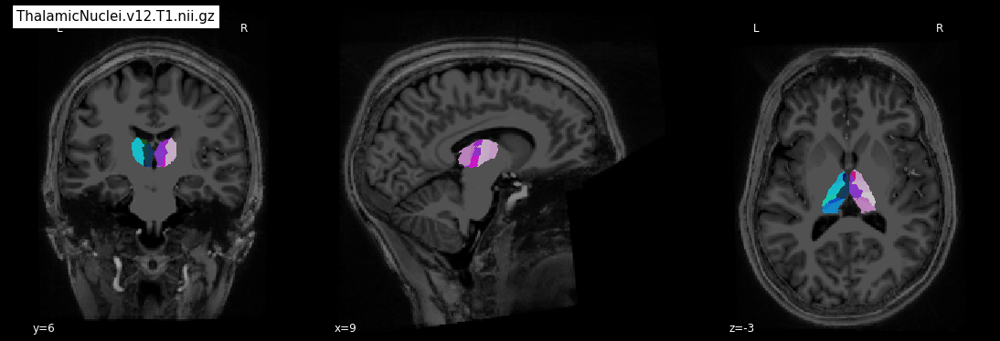

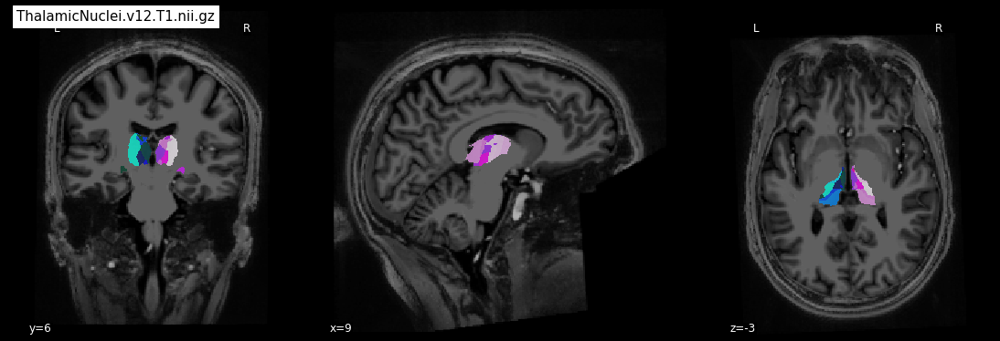

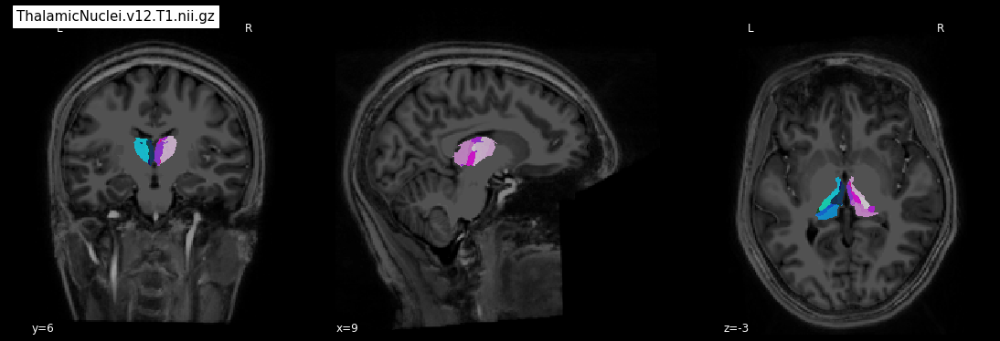

In [12]:
# awesome, looks good...
# bgs = sorted(glob.glob('../derivatives/fmriprep/fmriprep/sub-004/anat/sub-*_desc-preproc_T1w.nii.gz'))
bgs = sorted(glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/T1.mgz'))
thals = sorted(glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/ThalamicNuclei.v12*.nii.gz'))
thals = [x for x in thals if not 'FS' in x]

# for thal_img, bg_img in zip(thals[:5], bgs):
for thal_img, bg_img in zip(thals[:5], bgs[:5]):
    print(bg_img)
#     plotting.plot_roi(thal_img, bg_img=bg_img, draw_cross=False)
    plotting.plot_roi(thal_img, bg_img=bg_img, draw_cross=False, cut_coords=(9,6,-3),title=thal_img.split('/')[-1])
    plt.gcf().set_size_inches(15,5)

[]

### copy segmentations to deriavtives 

In [13]:
subs

['sub-024',
 'sub-026',
 'sub-033',
 'sub-035',
 'sub-039',
 'sub-041',
 'sub-042',
 'sub-043',
 'sub-044']

In [14]:
atlases = sorted(glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/ThalamicNuclei.v12.T1.nii.gz'))

for atlas in atlases:
    sub = atlas.split('/')[5].split('-')[1]
    output_fn = f'../derivatives/thalamic_segmentations/atlases_0p5mm/sub-{sub}/sub-{sub}_ThalamicNuclei.v12.T1.nii.gz'
    if not os.path.exists(os.path.dirname(output_fn)):
        os.makedirs(os.path.dirname(output_fn))
    
    print(atlas)
    print(output_fn)
    shutil.copy(atlas, output_fn)

/home/stevenm/test_freesurfer/freesurfer/sub-024/mri/ThalamicNuclei.v12.T1.nii.gz
../derivatives/thalamic_segmentations/atlases_0p5mm/sub-024/sub-024_ThalamicNuclei.v12.T1.nii.gz
/home/stevenm/test_freesurfer/freesurfer/sub-026/mri/ThalamicNuclei.v12.T1.nii.gz
../derivatives/thalamic_segmentations/atlases_0p5mm/sub-026/sub-026_ThalamicNuclei.v12.T1.nii.gz
/home/stevenm/test_freesurfer/freesurfer/sub-033/mri/ThalamicNuclei.v12.T1.nii.gz
../derivatives/thalamic_segmentations/atlases_0p5mm/sub-033/sub-033_ThalamicNuclei.v12.T1.nii.gz
/home/stevenm/test_freesurfer/freesurfer/sub-035/mri/ThalamicNuclei.v12.T1.nii.gz
../derivatives/thalamic_segmentations/atlases_0p5mm/sub-035/sub-035_ThalamicNuclei.v12.T1.nii.gz
/home/stevenm/test_freesurfer/freesurfer/sub-039/mri/ThalamicNuclei.v12.T1.nii.gz
../derivatives/thalamic_segmentations/atlases_0p5mm/sub-039/sub-039_ThalamicNuclei.v12.T1.nii.gz
/home/stevenm/test_freesurfer/freesurfer/sub-041/mri/ThalamicNuclei.v12.T1.nii.gz
../derivatives/thalamic

### convert atlas into multiple ROI images

In [15]:
# this is probably a stupid and complicated way to do it... but will work
# copy lookup table from freesurfer .lut file
lookuptable = '''8103 Left-AV 0 85 0 0
8104 Left-CeM 170 85 0 0
8105 Left-CL 0 170 0 0
8106 Left-CM 170 170 0 0
8108 Left-LD 170 255 0 0
8109 Left-LGN 0 0 127 0
8110 Left-LP 0 85 127 0
8111 Left-LSg 170 85 127 0
8112 Left-MDl 0 170 127 0
8113 Left-MDm 170 170 127 0
8115 Left-MGN 170 255 127 0
8116 Left-MV 0 0 255 0
8117 Left-Pc 170 0 255 0
8118 Left-Pf 0 85 255 0
8119 Left-Pt 170 85 255 0
8120 Left-PuA 0 170 255 0
8121 Left-PuI 170 170 255 0
8122 Left-PuL 0 255 255 0
8123 Left-PuM 170 255 255 0
8125 Left-R 255 0 0 0
8126 Left-VA 85 85 0 0
8127 Left-VAmc 255 85 0 0
8128 Left-VLa 85 170 0 0
8129 Left-VLp 255 170 0 0
8130 Left-VM 85 255 0 0
8133 Left-VPL 255 0 255 0
8134 Left-PaV 120 18 134 0
8203 Right-AV 0 85 0 0
8204 Right-CeM 170 85 0 0
8205 Right-CL 0 170 0 0
8206 Right-CM 170 170 0 0
8208 Right-LD 170 255 0 0
8209 Right-LGN 0 0 127 0
8210 Right-LP 0 85 127 0
8211 Right-LSg 170 85 127 0
8212 Right-MDl 0 170 127 0
8213 Right-MDm 170 170 127 0
8215 Right-MGN 170 255 127 0
8216 Right-MV 0 0 255 0
8217 Right-Pc 170 0 255 0
8218 Right-Pf 0 85 255 0
8219 Right-Pt 170 85 255 0
8220 Right-PuA 0 170 255 0
8221 Right-PuI 170 170 255 0
8222 Right-PuL 0 255 255 0
8223 Right-PuM 170 255 255 0
8225 Right-R 255 0 0 0
8226 Right-VA 85 85 0 0
8227 Right-VAmc 255 85 0 0
8228 Right-VLa 85 170 0 0
8229 Right-VLp 255 170 0 0
8230 Right-VM 85 255 0 0
8233 Right-VPL 255 0 255 0
8234 Right-PaV 120 18 134 0'''

lookup_sep = ' '.join(lookuptable.split(' ')).replace('\n', ' ').split(' ') # eugh
codes = lookup_sep[0::6]
rois = lookup_sep[1::6]
rois = [x.replace('Left-','') if 'Left-' in x else x.replace('Right-','') for x in [s+'-l' if 'Left-' in s else s+'-r' for s in rois]] # more eugh
roi_lookup = dict(zip(codes,rois))
# colors = lookup_sep[2::6]

In [16]:
# find all subs with segmentations
subs = sorted(glob.glob('/home/stevenm/test_freesurfer/freesurfer/sub-*/mri/ThalamicNuclei.v12.T1.nii.gz'))
subs = [x.split('/')[-3].strip('sub-') for x in subs]
# subs = ['002','003','004','005','006','007','008','009','010','011']
for sub in subs:
    print(sub)
    for code, roi in roi_lookup.items():
        output_fn = f'../derivatives/thalamic_segmentations/0p5mm/sub-{sub}/sub-{sub}_roi-{roi}_res-0p5.nii.gz'
#         output_fn = f'../derivatives/thalamic_segmentations/0p5mm/mni09c/mni09c_roi-{roi}_res-0p5.nii.gz'
        atlas = nib.load(f'/home/stevenm/test_freesurfer/freesurfer/sub-{sub}/mri/ThalamicNuclei.v12.T1.nii.gz')
#         atlas = nib.load(f'/home/scotti/test_freesurfer/freesurfer/mni1/mri/ThalamicNuclei.v12.T1.nii.gz')
        atlas_img = atlas.get_fdata()
        print(code)
        atlas_img[atlas_img!=int(code)] = 0
        atlas_img[atlas_img==int(code)] = 1 # binarise
        roi_img = nib.Nifti1Image(atlas_img, atlas.affine)
        if not os.path.isdir(os.path.dirname(output_fn)):
            os.makedirs(os.path.dirname(output_fn))
        nib.save(roi_img, output_fn)

024
8103
8104
8105
8106
8108
8109
8110
8111
8112
8113
8115
8116
8117
8118
8119
8120
8121
8122
8123
8125
8126
8127
8128
8129
8130
8133
8134
8203
8204
8205
8206
8208
8209
8210
8211
8212
8213
8215
8216
8217
8218
8219
8220
8221
8222
8223
8225
8226
8227
8228
8229
8230
8233
8234
026
8103
8104
8105
8106
8108
8109
8110
8111
8112
8113
8115
8116
8117
8118
8119
8120
8121
8122
8123
8125
8126
8127
8128
8129
8130
8133
8134
8203
8204
8205
8206
8208
8209
8210
8211
8212
8213
8215
8216
8217
8218
8219
8220
8221
8222
8223
8225
8226
8227
8228
8229
8230
8233
8234
033
8103
8104
8105
8106
8108
8109
8110
8111
8112
8113
8115
8116
8117
8118
8119
8120
8121
8122
8123
8125
8126
8127
8128
8129
8130
8133
8134
8203
8204
8205
8206
8208
8209
8210
8211
8212
8213
8215
8216
8217
8218
8219
8220
8221
8222
8223
8225
8226
8227
8228
8229
8230
8233
8234
035
8103
8104
8105
8106
8108
8109
8110
8111
8112
8113
8115
8116
8117
8118
8119
8120
8121
8122
8123
8125
8126
8127
8128
8129
8130
8133
8134
8203
8204
8205
8206
8208
8209
8210
8211

### check the individual ROIs now

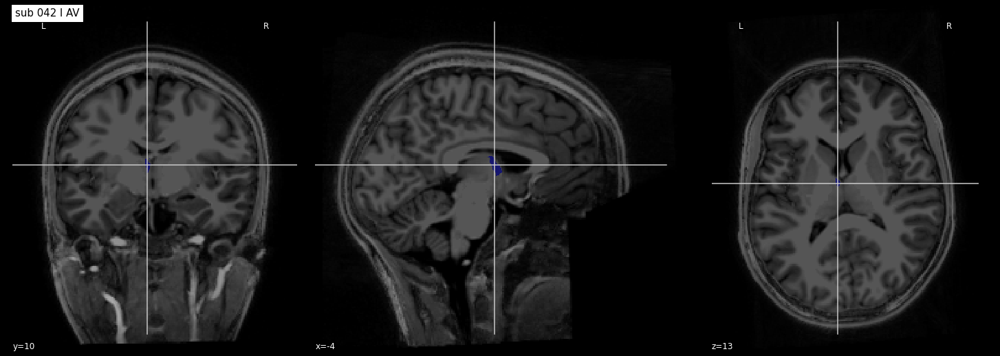

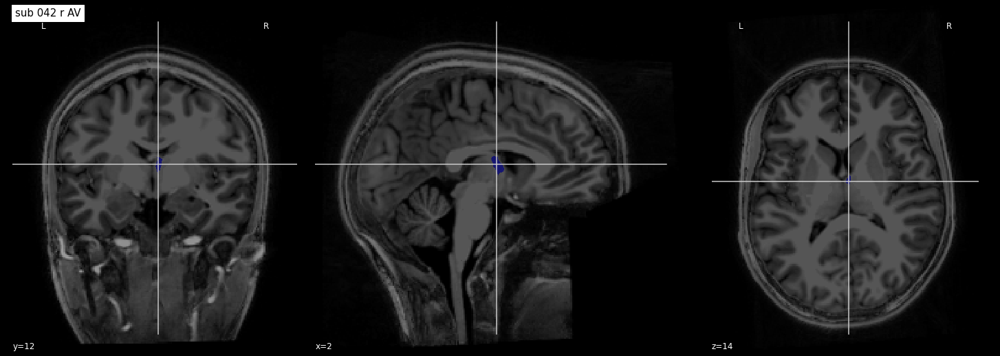

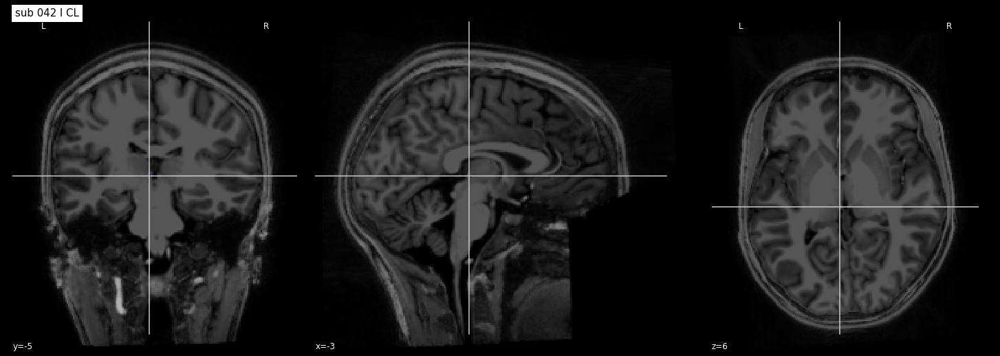

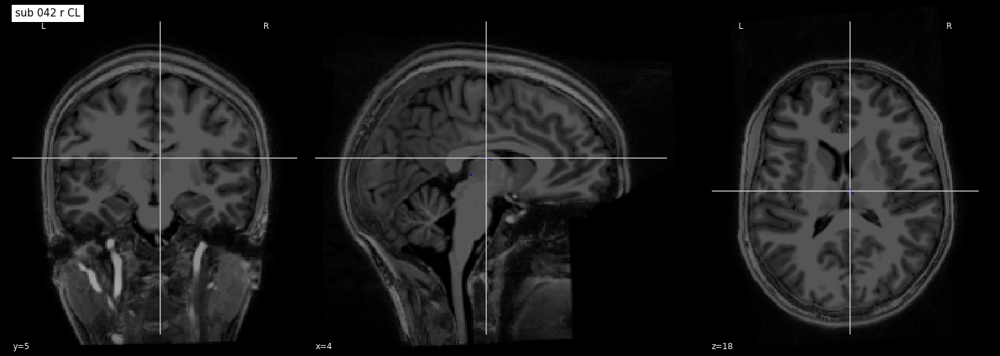

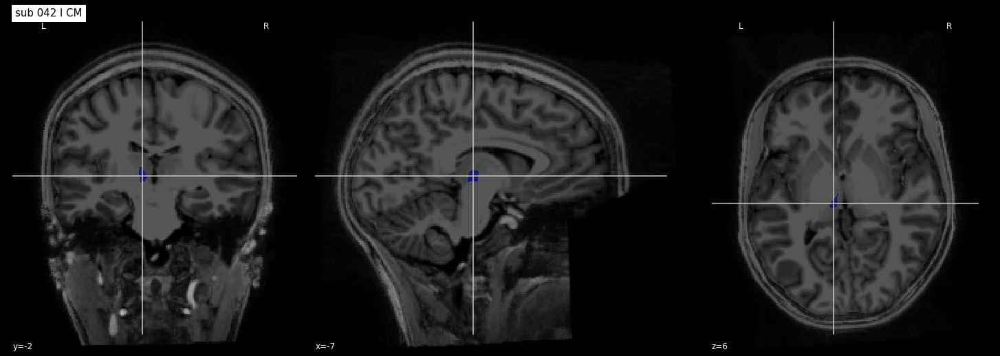

In [17]:
sub = '042'
rois_toplot = sorted(glob.glob(f'../derivatives/thalamic_segmentations/0p5mm/sub-{sub}/*'))
bg = f'/home/stevenm/test_freesurfer/freesurfer/sub-{sub}/mri/T1.mgz'

regex = re.compile(f'.*sub-{sub}_roi-(?P<label>[a-zA-Z0-9]+)-(?P<side>[a-zA-Z0-9]+)_res-0p5.nii.gz')
for label in rois_toplot[:5]:
    gd = regex.match(label).groupdict()
    plotting.plot_roi(label, bg, title = f"sub {sub} {gd['side']} {gd['label']}")
    plt.gcf().set_size_inches(20,7)

### convert to from 0p5mm structural to 1p5mm functional

In [18]:
subs

['024', '026', '033', '035', '039', '041', '042', '043', '044']

In [19]:
def warp_thal_map(args, atlas, target_img):
    # masks are already binerized
    label_n, label = args
#     print(label_n)
#     print(label)
    this_map = atlas.get_fdata().copy()
    this_map_nii = nib.Nifti1Image(this_map, atlas.affine)

    # ok now we need to do this rather annoying temporary save thing agian
    resampled_img = nilearn.image.resample_to_img(source_img=this_map_nii, target_img=target_img, interpolation='linear')
    return resampled_img

def load_thal_atlas_1p5mm(sub): 

    labels_54structures = ['AV-l', 'CeM-l', 'CL-l', 'CM-l', 'LD-l', 'LGN-l', 'LP-l', 'LSg-l', 'MDl-l', 'MDm-l', 'MGN-l', 'MV-l',\
                         'Pc-l', 'Pf-l', 'Pt-l', 'PuA-l', 'PuI-l', 'PuL-l', 'PuM-l', 'R-l', 'VA-l', 'VAmc-l', 'VLa-l', 'VLp-l',\
                         'VM-l', 'VPL-l', 'PaV-l', 'AV-r', 'CeM-r', 'CL-r', 'CM-r', 'LD-r', 'LGN-r', 'LP-r', 'LSg-r', 'MDl-r',\
                         'MDm-r', 'MGN-r', 'MV-r', 'Pc-r', 'Pf-r', 'Pt-r', 'PuA-r', 'PuI-r', 'PuL-r', 'PuM-r', 'R-r', 'VA-r',\
                         'VAmc-r', 'VLa-r', 'VLp-r', 'VM-r', 'VPL-r', 'PaV-r']
    
    # save fns
    save_fn_template = f'../derivatives/masks_thal_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-{{}}.nii.gz'

    for label_n, roi in enumerate(labels_54structures):
#         print(roi)
        atlas_fn = os.path.join('..', 'derivatives', 'thalamic_segmentations', '0p5mm', f'sub-{sub}', f'sub-{sub}_roi-{roi}_res-0p5.nii.gz')
        target_img = sorted(glob.glob(f'../derivatives/fmriprep/fmriprep/sub-{sub}/ses-anatomical/func/sub-{sub}_ses-anatomical_task-rs_run-1_space-T1w_boldref.nii.gz'))#[0]
        atlas = nib.load(atlas_fn)
        mapping = warp_thal_map([label_n, roi], atlas, target_img)

        # save
        os.makedirs(os.path.dirname(save_fn_template), exist_ok=True)
        mapping.to_filename(save_fn_template.format(roi))

    return mapping

In [20]:
# check which subs have thalamic masks
seg_subjects = [x.split('/')[4].split('-')[1] for x in sorted(glob.glob('../derivatives/thalamic_segmentations/0p5mm/sub-*/'))]
check_subjects = [x.split('-')[1].split('.')[0] for x in sorted(glob.glob('../derivatives/fmriprep/fmriprep/sub-*.html'))]
all_subjects = list(set(seg_subjects).intersection(check_subjects))
# all_subjects = ['004']
# all_subjects = ['002','003','004','005','006','007','008','009','010','011']
for subject in all_subjects:
    print(subject)
    load_thal_atlas_1p5mm(subject)

003


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

030


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

031


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

006


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

043


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

010


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

020


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

036


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

037


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

018


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

038


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

014


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

012


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

009


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

008


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

041


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

026


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

027


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

042


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

025


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

035


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

016


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

029


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

015


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

021


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

044


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

005


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

034


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

032


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

017


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

013


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

004


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

007


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

019


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

039


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

022


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

024


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

002


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

033


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

040


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

023


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

011


/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.

/home/stevenm/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning:

Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might

In [ ]:
sub ='043'
disp = plotting.plot_roi(f'../derivatives/masks_thal_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-CeM-r.nii.gz', 
                         bg_img=f'../derivatives/fmriprep/fmriprep/sub-{sub}/ses-anatomical/func/sub-{sub}_ses-anatomical_task-rs_run-1_space-T1w_boldref.nii.gz',threshold=0.001)
add_contours(disp, roi=f'../derivatives/masks_thal_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-AV-l.nii.gz')
add_contours(disp, roi=f'../derivatives/masks_thal_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-AV-r.nii.gz')

plt.gcf().set_size_inches(15,5)

# convert 0p5mm MNI to 1mm

Thalamic segmentation algorithm spits out the mni segmentations as 0.5mm so lets resample them to 1mm to use them on the group mni spms

/home/scotti/.conda/envs/py38/lib/python3.8/site-packages/nilearn/plotting/displays.py:607: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = plt.figure(figure, figsize=figsize,
/home/scotti/.conda/envs/py38/lib/python3.8/site-packages/nilearn/plotting/find_cuts.py:61: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(
/home/scotti/.conda/envs/py38/lib/python3.8/site-packages/nilearn/plotting/displays.py:786: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/home/scotti/.conda/envs/py38/lib/python3.8/site-packages/numpy/ma/core.py:2831: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/home/scotti/.conda/envs/py38/lib/pyt

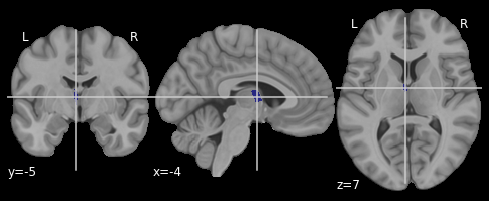

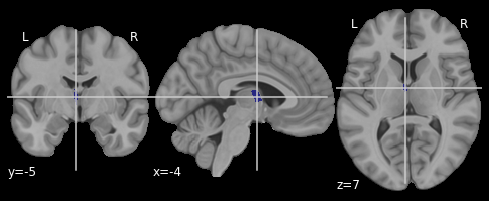

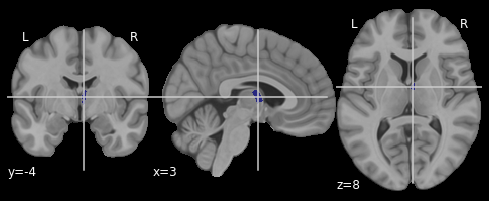

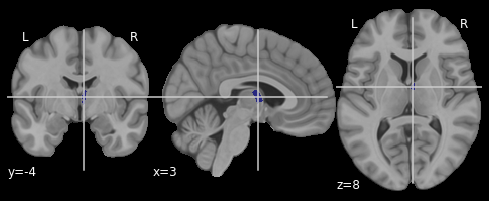

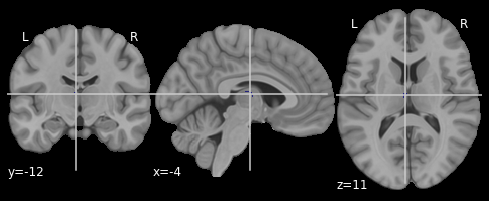

...

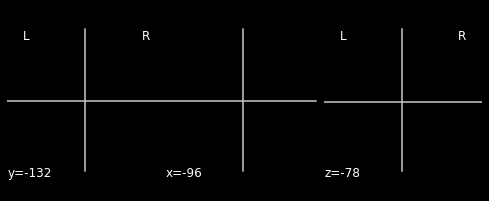

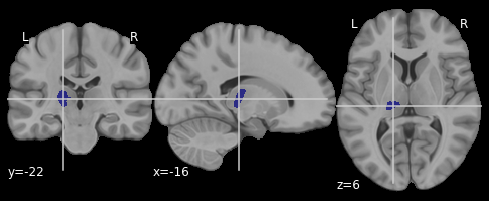

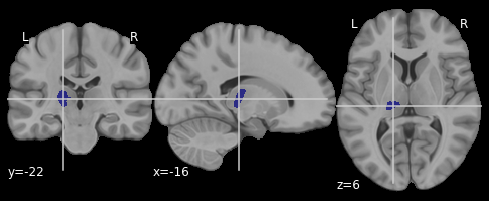

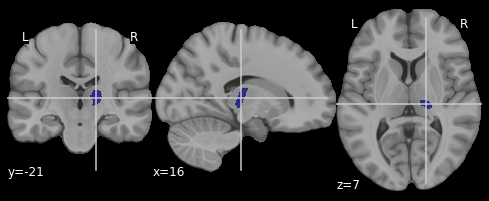

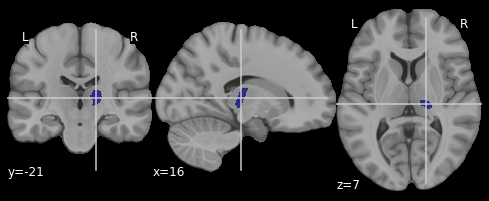

In [30]:
mni0p5_fns = sorted(glob.glob('../derivatives/thalamic_segmentations/mni09c/*.nii.gz'))

# first lets rename the original so we know the resolution
# mni0p5_rename = [x.replace('.nii.gz','_res-0p5.nii.gz') for x in mni0p5_fns]
# for orig, new in zip(mni0p5_fns, mni0p5_rename):
# 
#     shutil.move(orig, new) # done this

mni09_1p0 = nib.load('/home/Public/trondheim/sourcedata/templates/mni_icbm152_t1_tal_nlin_asym_09c_brain.nii')

for i in mni0p5_fns:
    
    new_fn = i.replace('_res-0p5','_res-1p0')
    i_resampled = nilearn.image.resample_img(i, target_affine=mni09_1p0.affine, interpolation='linear')
    plotting.plot_roi(i_resampled, mni09_1p0)
    i_resampled.to_filename(new_fn)

## Convert individual atlases to 0.75mm so we can compare with MASSP

In [31]:
all_masks = sorted(glob.glob('../derivatives/thalamic_segmentations/atlases_0p5mm/sub-*/*.nii.gz'))
templates = sorted(glob.glob('../derivatives/nighres/sub-*/ses-anatomical/subcortex/*probas*'))
# first lets rename the original so we know the resolution
# mni0p5_rename = [x.replace('.nii.gz','_res-0p5.nii.gz') for x in mni0p5_fns]
# for orig, new in zip(mni0p5_fns, mni0p5_rename):
# 
#     shutil.move(orig, new) # done this

# mni09_1p0 = nib.load('/home/Public/trondheim/sourcedata/templates/mni_icbm152_t1_tal_nlin_asym_09c_brain.nii')

for mask, template in zip(all_masks, templates):
    load_massp = nib.load(template)
    new_fn = mask.replace('v12.T1.','v12.T1_res-0p75.').replace('0p5mm','0p75mm')
    resampled_img = nilearn.image.resample_img(mask, target_affine=load_massp.affine, interpolation='linear')
#     plotting.plot_roi(resampled_img, template)
    print(new_fn)
    if not os.path.exists(os.path.dirname(new_fn)):
        os.makedirs(os.path.dirname(new_fn), exist_ok=True)
#     resampled_img.to_filename(new_fn)

../derivatives/thalamic_segmentations/atlases_0p75mm/sub-002/sub-002_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-003/sub-003_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-004/sub-004_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-005/sub-005_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-006/sub-006_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-007/sub-007_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-008/sub-008_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-009/sub-009_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations/atlases_0p75mm/sub-010/sub-010_ThalamicNuclei.v12.T1_res-0p75.nii.gz
../derivatives/thalamic_segmentations

## calcualate dice of MASSP segmented thalamus and freesrufer segmentated thalamus

Compare 1.5mm functionally aligned masks (as this is where we're using them the most anyway)

first need to convert subregional thalamus mask into one whole region mask

In [32]:
thal_l = sorted(glob.glob('../derivatives/masks_thal_func/sub-*/anat/sub-*_space-T1w_desc-mask-*-l.nii.gz')) #freesurfer thalamus left
thal_r = sorted(glob.glob('../derivatives/masks_thal_func/sub-*/anat/sub-*_space-T1w_desc-mask-*-r.nii.gz')) # freesurfer thalamus right

subs = list(set([x.split('/')[3].split('-')[1] for x in thal_l]))

In [33]:
sorted(subs)

['002',
 '003',
 '004',
 '005',
 '006',
 '007',
 '008',
 '009',
 '010',
 '011',
 '012',
 '013',
 '014',
 '015',
 '016',
 '017',
 '018',
 '019',
 '020',
 '021',
 '022',
 '023',
 '024',
 '025',
 '026',
 '027',
 '029',
 '030',
 '031',
 '032',
 '033',
 '034',
 '036',
 '037',
 '038',
 '039',
 '040',
 '042']

In [34]:
thal_l = sorted(glob.glob('../derivatives/masks_thal_func/sub-*/anat/sub-*_space-T1w_desc-mask-*-l.nii.gz')) #freesurfer thalamus left
thal_r = sorted(glob.glob('../derivatives/masks_thal_func/sub-*/anat/sub-*_space-T1w_desc-mask-*-r.nii.gz')) # freesurfer thalamus right

subs = list(set([x.split('/')[3].split('-')[1] for x in thal_l]))
# merge invidual thalamus masks into one hemisphere
# subs = ['002']
for sub in subs:
    to_merge = [x for x in thal_l if sub in x]
    atlas = image.load_img(to_merge)
    atlas = image.math_img('np.sum(img, axis=-1)', img=atlas)
    output_fn = f'/home/scotti/tempt_atlas_dice/sub-{sub}/sub-{sub}_space-T1w_desc-mask-merged-Tha-l.nii.gz'
    if not os.path.exists(os.path.dirname(output_fn)):
        os.makedirs(os.path.dirname(output_fn), exist_ok=True)
    atlas.to_filename(output_fn)
    
    to_merge = [x for x in thal_r if sub in x]
    atlas = image.load_img(to_merge)
    atlas = image.math_img('np.sum(img, axis=-1)', img=atlas)
    output_fn = f'/home/scotti/tempt_atlas_dice/sub-{sub}/sub-{sub}_space-T1w_desc-mask-merged-Tha-r.nii.gz'
    if not os.path.exists(os.path.dirname(output_fn)):
        os.makedirs(os.path.dirname(output_fn), exist_ok=True)
    atlas.to_filename(output_fn)



#### Then can get dicey

In [42]:
subs = [x.split('/')[3].split('-')[1] for x in sorted(glob.glob('../derivatives/masks_massp_func/sub-*/'))]
subs = [x for x in subs if '035' not in x]
subs = [x for x in subs if '041' not in x]
# subs=['012']

dice_scores = []

for sub in subs:
    
    print(sub)
    massp_l =  nighres.io.load_volume(f'../derivatives/masks_massp_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-Tha-l.nii.gz').get_fdata()
    massp_r =  nighres.io.load_volume(f'../derivatives/masks_massp_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-Tha-r.nii.gz').get_fdata()
    thal_l =  nighres.io.load_volume(f'/home/scotti/tempt_atlas_dice/sub-{sub}/sub-{sub}_space-T1w_desc-mask-merged-Tha-l.nii.gz').get_fdata()
    thal_r =  nighres.io.load_volume(f'/home/scotti/tempt_atlas_dice/sub-{sub}/sub-{sub}_space-T1w_desc-mask-merged-Tha-r.nii.gz').get_fdata()
    
    if (thal_l.shape != massp_l.shape) or (thal_r.shape != massp_r.shape):
        print(f'sub {sub} masks are not aligned properly - fix!')
        continue
    
    diceL = 2*np.sum((massp_l>0)*(thal_l>0))/(np.sum(massp_l>0)+np.sum(thal_l>0))
    diceR = 2*np.sum((massp_r>0)*(thal_r>0))/(np.sum(massp_r>0)+np.sum(thal_r>0))

    dice_scores.append([sub, diceL, diceR])
    
dices = pd.DataFrame(dice_scores, columns=['sub','dice_left','dice_right'])
    
print(f"mean dice left thalamus: {dices['dice_left'].mean()}")
print(f"mean dice right thalamus: {dices['dice_right'].mean()}")

002
003
004
005
006
007
008
009
010
011
012
013
014
015
016
017
018
019
020
021
022
023
024
025
026
027
029
030
031
032
033
034
036
037
038
039
040
042
mean dice left thalamus: 0.8249209757283916
mean dice right thalamus: 0.8113852448124967


In [83]:
subs = [x.split('/')[3].split('-')[1] for x in sorted(glob.glob('../derivatives/masks_massp_func/sub-*/'))]
# subs=['012']

dice_scores = []

for sub in subs:
    
    print(sub)
    massp_l =  nighres.io.load_volume(f'../derivatives/masks_massp_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-Tha-l.nii.gz').get_fdata()
    massp_r =  nighres.io.load_volume(f'../derivatives/masks_massp_func/sub-{sub}/anat/sub-{sub}_space-T1w_desc-mask-Tha-r.nii.gz').get_fdata()
    thal_l =  nighres.io.load_volume(f'/home/scotti/tempt_atlas_dice/sub-{sub}/sub-{sub}_space-T1w_desc-mask-merged-Tha-l.nii.gz').get_fdata()
    thal_r =  nighres.io.load_volume(f'/home/scotti/tempt_atlas_dice/sub-{sub}/sub-{sub}_space-T1w_desc-mask-merged-Tha-r.nii.gz').get_fdata()
    
    if (thal_l.shape != massp_l.shape) or (thal_r.shape != massp_r.shape):
        print(f'sub {sub} masks are not aligned properly - fix!')
        continue
    
    diceL = 2*np.sum((massp_l>0)*(thal_l>0))/(np.sum(massp_l>0)+np.sum(thal_l>0))
    diceR = 2*np.sum((massp_r>0)*(thal_r>0))/(np.sum(massp_r>0)+np.sum(thal_r>0))

    dice_scores.append([sub, diceL, diceR])
    
dices = pd.DataFrame(dice_scores, columns=['sub','dice_left','dice_right'])
    
print(f"mean dice left thalamus: {dices['dice_left'].mean()}")
print(f"mean dice right thalamus: {dices['dice_right'].mean()}")

007
008
009
010
011
012
013
014
015
016
017
018
019
020
021
022
023
024
025
026
027
029
030
033
034
036
037
038
sub 038 masks are not aligned properly - fix!
mean dice left thalamus: 0.8234369896624867
mean dice right thalamus: 0.8048402069768871


# -----RANDOM CODE----

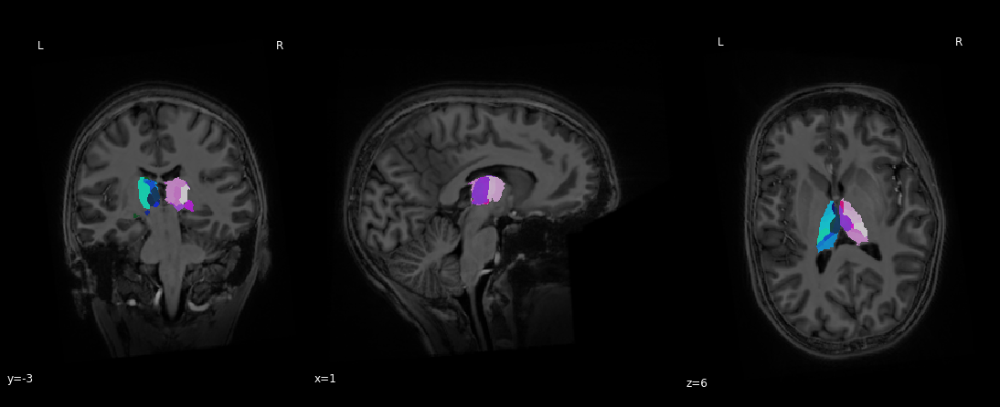

In [33]:
plotting.plot_roi('/home/Public/trondheim/derivatives/thalamic_segmentations/atlases_0p5mm/sub-002/sub-002_ThalamicNuclei.v12.T1.nii.gz', bg_img = '../derivatives/fmriprep/fmriprep/sub-002/anat/sub-002_desc-preproc_T1w.nii.gz', draw_cross=False, cut_coords=(1,-3,6))
plt.gcf().set_size_inches(15,6)

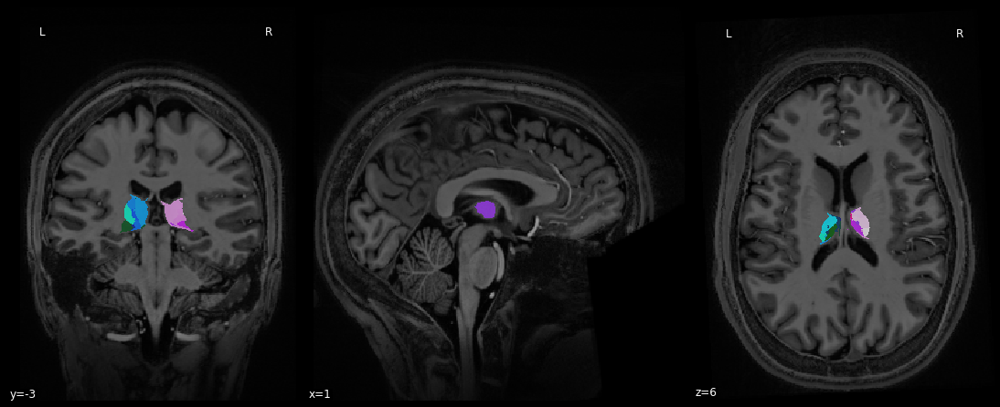

In [34]:
plotting.plot_roi('/home/Public/trondheim/derivatives/thalamic_segmentations/atlases_0p5mm/sub-004/sub-004_ThalamicNuclei.v12.T1.nii.gz', bg_img = '../derivatives/fmriprep/fmriprep/sub-004/anat/sub-004_desc-preproc_T1w.nii.gz', draw_cross=False, cut_coords=(1,-3,6))
plt.gcf().set_size_inches(15,6)

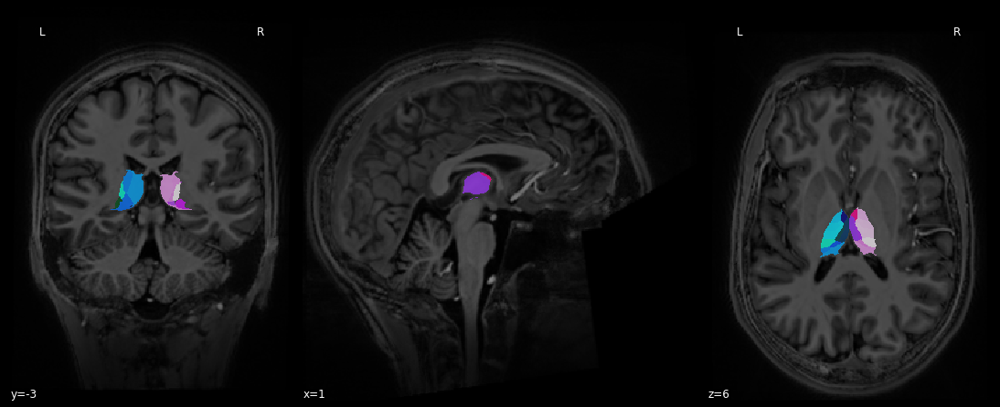

In [35]:
plotting.plot_roi('/home/Public/trondheim/derivatives/thalamic_segmentations/atlases_0p5mm/sub-010/sub-010_ThalamicNuclei.v12.T1.nii.gz', bg_img = '../derivatives/fmriprep/fmriprep/sub-010/anat/sub-010_desc-preproc_T1w.nii.gz', draw_cross=False, cut_coords=(1,-3,6))
plt.gcf().set_size_inches(15,6)

### Now warp them to MNI so we can check group level shizzle

In [ ]:
# obviously only need to warp one to MNI

In [ ]:
all_subjects = [x.split('/')[-2].split('-')[-1] for x in sorted(glob.glob('../derivatives/fmriprep/fmriprep/sub*/ses-anatomical'))]
all_subjects=['015']
def warp_masks_2_mni(sub, overwrite=False):
    print(sub)
#     regex_masks = re.compile('.*/space-MNI152NLin2009cAsym_label-(?P<label>\S+)_probseg.nii.gz')
    regex_masks = re.compile('.*space-T1w_desc-mask-(?P<label>\S+).nii.gz')
    all_masks = sorted(glob.glob('../derivatives/masks_thal_func/sub-*/anat/*space-T1w*.nii.gz'))
    
    output_img_base = f'../derivatives/masks_thal_func/sub-{sub}/anat/sub-{sub}_space-MNI152NLin2009cAsym_desc-mask-{{label}}.nii.gz'
    
    for mask in all_masks:
        mask_label = regex_masks.match(mask).groupdict()['label']
        
        final_img_fn = output_img_base.format(label=mask_label)
        if not os.path.exists(final_img_fn) or overwrite:
            os.makedirs(os.path.dirname(final_img_fn), exist_ok=True)
            tmp_img_name = apply_warp(mask, sub=sub, t1w_to_MNI=True)
            shutil.move(tmp_img_name, final_img_fn)
            
    return 0
for sub in all_subjects:
    warp_masks_2_mni(sub)
# _ = [warp_masks_2_t1w(x) for x in all_subjects]
# with mp.Pool(20) as p:
#     p.map(warp_masks_2_mni, all_subjects)

In [ ]:
def get_roi_dict():
    # make dict of masks & filenames in 09c-space, get colors
#     fns = glob.glob('/home/Public/trondheim/sourcedata/masks/MNI152NLin2009cAsym_res-1p5/space-MNI152NLin2009cAsym_res-*') # find all masks at 1p5 resolution
    fns = glob.glob('/home/scotti/test_freesurfer/freesurfer/sub-*/mri/ThalamicNuclei.v12.T1.nii.gz')
    fns.sort()
    names = [re.match('.*space-(?P<space>[a-zA-Z0-9]+)_res-1p5_label-(?P<label>[a-zA-Z0-9]+)_probseg_def-img.nii.gz', fn).groupdict()['label'] for fn in fns]
    roi_dict = dict(zip(names, fns))
    for mask, fn in roi_dict.items():
        roi_dict[mask] = {}
        roi_dict[mask]['fn'] = fn
        roi_dict[mask]['color'] = get_color(mask)
        roi_dict[mask]['threshold'] = 0.3
    return roi_dict

In [ ]:
from nilearn.input_data import NiftiLabelsMasker
masker = NiftiLabelsMasker(labels_img=thal_img = '/home/scotti/test_freesurfer/freesurfer/sub-003/mri/ThalamicNuclei.v12.T1.nii.gz', standardize=True,
                           memory='nilearn_cache', verbose=5)

In [ ]:
time_series = masker.fit_transform('../derivatives/fmriprep/fmriprep/sub-003/func', confounds=

In [ ]:
all_subjects=['002']
def warp_masks_2_mni(sub, overwrite=False):
    print(sub)
#     regex_masks = re.compile('.*/space-MNI152NLin2009cAsym_label-(?P<label>\S+)_probseg.nii.gz')
#     regex_masks = re.compile('.*space-T1w_desc-mask-(?P<label>\S+).nii.gz')
    all_masks = sorted(glob.glob(f'../derivatives/fmriprep/fmriprep/sub-{sub}/ses-anatomical/func/*space-T1w*preproc_bold*.nii.gz'))
    
    output_img_base = f'../scripts/sub-{sub}_space-MNI152NLin2009cAsym_desc-bold.nii.gz'
    print(all_masks) 
    for mask in all_masks:
#         mask_label = regex_masks.match(mask).groupdict()['label']
        
        final_img_fn = output_img_base
        if not os.path.exists(final_img_fn) or overwrite:
            os.makedirs(os.path.dirname(final_img_fn), exist_ok=True)
            tmp_img_name = apply_warp(mask, sub=sub, t1w_to_MNI=True)
            shutil.move(tmp_img_name, final_img_fn)
            
    return 0
for sub in all_subjects:
    warp_masks_2_mni(sub)

In [ ]:
plotting.plot_stat_map('./sub-002_space-MNI152NLin2009cAsym_desc-bold.nii.gz')

In [ ]:
np.arange(12)

In [ ]:
mask = nib.load('/home/Public/trondheim/derivatives/masks_thal_func/sub-002/anat/sub-002_space-T1w_desc-mask-AV-l.nii.gz').get_fdata()
print(mask.sum())

In [ ]:
print(mask[mask!=0])

In [ ]:
mask = nib.load('/home/Public/trondheim/derivatives/thalamic_segmentations/0p5mm/sub-003/sub-003_roi-AV-l_res-0p5.nii.gz').get_fdata()
print(mask.sum())

In [94]:
i=3
j=3

In [95]:
cell_neighbours = set([(i-1,j+1),
                   (i,j+1),
                   (i+1, j+1),
                   (i-1,j),
                   (i+1,j),
                   (i-1,j-1),
                   (i,j-1),
                   (i+1,j-1)])

In [97]:
for enum, (check_i, check_j) in enumerate(cell_neighbours):
    print(cell_neighbours[enum])

TypeError: 'set' object is not subscriptable